In [1]:
import matplotlib as mpl
import matplotlib.pyplot as plt

In [2]:
%matplotlib inline

In [3]:
import numpy as np

In [4]:
from numpy.random import randn

In [5]:
from scipy import stats 

In [6]:
import seaborn as sns

In [7]:
import pandas as pd
from sklearn import datasets, svm, cross_validation, tree, preprocessing, metrics

C:\Users\dtele\AppData\Local\Continuum\Anaconda3\lib\site-packages\sklearn\cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


In [8]:
import sklearn.ensemble as ske

In [9]:
import requests
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.cross_validation import train_test_split
from sklearn.naive_bayes import MultinomialNB
import warnings

warnings.filterwarnings("ignore")

In [10]:
import logging
from optparse import OptionParser
import sys
from time import time

In [11]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import HashingVectorizer
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.linear_model import RidgeClassifier
from sklearn.svm import LinearSVC
from sklearn.linear_model import SGDClassifier
from sklearn.linear_model import Perceptron
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.naive_bayes import BernoulliNB, MultinomialNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import NearestCentroid
from sklearn.ensemble import RandomForestClassifier
from sklearn.utils.extmath import density
from sklearn import metrics
from sklearn.feature_extraction.text import TfidfTransformer

In [12]:
taws_df = pd.read_excel('just_3.xlsx', 'Sheet1', index_col=None, na_values=['NA'])

In [13]:
taws_df.head()

,CAUSE_LEVEL_1,Description,Resolution,Corrective_Action_lessons,General_Catigory,LOCATION,Merge
0,PEOPLE,"J/Eng was checking the chemical racks, where h...",1)Empty drums should not be used for storing o...,RCA - Improper storage CA - Agree with the cor...,NEAR CHEMICAL RELEASE,STORAGE SPACE,"J/Eng was checking the chemical racks, where h..."
1,ENVIRONMENT / WEATHER,One stay wire connected to Christmas Tree loos...,All stay wires should be checked for its funct...,RCA - Inadequate supervision and maintenance C...,WEATHER,OTHER,One stay wire connected to Christmas Tree loos...
2,PEOPLE,I found out that Pilot combination ladder (P) ...,NaN,RCA - Inadequate supervision and maintenance C...,EQUIPMENT CONDITION,DECK,I found out that Pilot combination ladder (P) ...
3,PEOPLE,AT (Time). One crew member kept food in microw...,while using micro wave it should not be left u...,We agree with the corrective action suggested ...,NEAR FIRE,GALLEY,AT (Time). One crew member kept food in microw...
4,PEOPLE,During loading operations in (Location) by shi...,All crew was instructed not to walk under susp...,RCA - Lack of knowledge and failure to warn CA...,NEAR CRUSHED BY,DECK,During loading operations in (Location) by shi...


In [14]:
taws_df.count()

CAUSE_LEVEL_1                30248
Description                  30248
Resolution                   23133
Corrective_Action_lessons    27446
General_Catigory             30248
LOCATION                     30248
Merge                        30248
dtype: int64

In [15]:
transformer = TfidfTransformer(smooth_idf=False)

In [16]:
transformer 

TfidfTransformer(norm='l2', smooth_idf=False, sublinear_tf=False,
         use_idf=True)

In [17]:
corpus = taws_df['Merge']

In [18]:
corpus

0        J/Eng was checking the chemical racks, where h...
1        One stay wire connected to Christmas Tree loos...
2        I found out that Pilot combination ladder (P) ...
3        AT (Time). One crew member kept food in microw...
4        During loading operations in (Location) by shi...
5        BEFORE WHEN WE WERE ENTERING INTO CARGO HOLD N...
6        Loading Master Found Using Cell Phone On deck,...
7        Deck Crew not wearing Safety Helmet while work...
8        During bunkering operation found 4/E not wear ...
9        One of the crew members lost his eye goggles i...
10       GENERATOR SPARE CYLINDER HEAD WAS FOUND UNSECU...
11       The Fitter was noticed by the master coming on...
12       It was found that there was a fire in the dust...
13       As i enter the crew mess to get some water to ...
14       A CREW MEMBER WAS OBSERVED WALKING DOWN THE ST...
15       DURING ROUTINE CHECKING AROUND DECK FOUND AB  ...
16       The tug broke the ships rope while pulling it..

In [19]:
vectorizer = CountVectorizer(min_df=1)

In [20]:
X = vectorizer.fit_transform(corpus).toarray()

In [21]:
print (X.shape)

(30248, 30382)


In [22]:
X

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ..., 
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [23]:
vectorizer.get_feature_names()

['00',
 '000',
 '0000',
 '0000h',
 '0000hrs',
 '0005',
 '0006',
 '0008',
 '000lb',
 '001',
 '0010',
 '00100lt',
 '0015',
 '0015lt',
 '002',
 '0020',
 '0025',
 '00250lt',
 '0029',
 '003',
 '0030',
 '0035',
 '004',
 '0042lt',
 '0045',
 '0045hrs',
 '005',
 '005s',
 '006',
 '007',
 '009',
 '009591959',
 '00am',
 '00h18',
 '00lt',
 '00m',
 '01',
 '010',
 '0100',
 '0100hrs',
 '0100lt',
 '0105',
 '0105h',
 '011',
 '0110hrs',
 '0115',
 '0118',
 '011vwd',
 '012',
 '0125lt',
 '0130',
 '0130hr',
 '013vwd',
 '014',
 '0145',
 '015',
 '0150',
 '016',
 '0169',
 '017',
 '019',
 '01and',
 '01chk',
 '01fig',
 '01no',
 '01st',
 '02',
 '0200',
 '0200hrs',
 '021',
 '0210',
 '0212',
 '0215lt',
 '022',
 '0220',
 '0221',
 '0224',
 '0228',
 '022vcp',
 '0230',
 '0230hrs',
 '0234',
 '0237',
 '023as',
 '024',
 '0240',
 '0242',
 '0248',
 '025',
 '0250',
 '0255',
 '027â',
 '02chk',
 '02fig',
 '02frm',
 '03',
 '030',
 '0300',
 '0300lt',
 '0308',
 '031',
 '0310',
 '0313',
 '0315lt',
 '0318lt',
 '032',
 '0327hrs',
 '0

In [24]:
from sklearn.feature_extraction.text import HashingVectorizer

In [25]:
hv = HashingVectorizer(stop_words='english')

In [26]:
Z = hv.transform(corpus)

In [27]:
Z

<30248x1048576 sparse matrix of type '<class 'numpy.float64'>'
	with 1028646 stored elements in Compressed Sparse Row format>

In [28]:
Z_train, Z_test, y_train, y_test = cross_validation.train_test_split(Z, y, test_size = 0.2)

NameError: name 'y' is not defined

In [41]:
clz = MultinomialNB()
clz.fit(X_train, y_train)
clz.score(X_test, y_test)

0.72876033057851242

In [24]:
causes = taws_df["CAUSE_LEVEL_1"].unique()
cause_dict = {value:index for index, value in enumerate(causes)}
y = taws_df["CAUSE_LEVEL_1"].map(cause_dict)
cause_dict

{'     nb      vcnb  ': 5,
 'ENVIRONMENT / WEATHER': 1,
 'EQUIPMENT': 2,
 'ORGANIZATION': 4,
 'PEOPLE': 0,
 'UNSPECIFIED': 3}

In [25]:
print ("corpuse size: %s" % len(vectorizer.get_feature_names()))

corpuse size: 30382


In [26]:
X_train, X_test, y_train, y_test = cross_validation.train_test_split(X, y, test_size = 0.2)

In [26]:
clf_dt = tree.DecisionTreeClassifier(max_depth=10)

In [27]:
clf_dt.fit (X_train, y_train)
clf_dt.score (X_test, y_test)

0.76909090909090905

In [27]:
clf = MultinomialNB()
clf.fit(X_train, y_train)
clf.score(X_test, y_test)

0.77438016528925624

In [28]:
y_test

22028    2
27288    0
23675    0
20000    0
27764    2
563      2
455      0
20767    0
26074    0
10552    0
26131    0
5617     0
20974    0
26982    0
28571    0
2165     0
16201    2
15309    0
19159    2
25235    2
28209    0
27695    0
3827     1
14273    2
22694    2
28616    0
5430     0
27677    0
6543     0
8961     0
        ..
6532     0
27915    2
9684     0
13792    0
22968    0
5028     0
21977    0
11358    0
9108     0
18379    4
482      0
16825    2
21081    2
12423    2
11172    0
16619    0
6381     0
28916    0
5655     0
27168    0
8512     0
2053     0
19315    0
28885    0
17280    2
27162    0
5297     0
2089     0
18730    2
27474    0
Name: CAUSE_LEVEL_1, dtype: int64

In [29]:
y_pred = clf.predict(X_test)

In [36]:
from sklearn.model_selection import cross_val_score

In [37]:
from sklearn import metrics

In [36]:
scores = cross_val_score(clf, X, y, cv = 5, scoring = 'f1_macro') 

In [ ]:
print("Accuracy: %0.2f (+/- %0.2f)") % (scores.mean(),scores.std()*2)

In [47]:
from sklearn.metrics import confusion_matrix

In [48]:
print(__doc__)

import itertools
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix


Automatically created module for IPython interactive environment


In [49]:
cm = confusion_matrix(y_test, y_pred)

In [50]:
cm

array([[3914,    4,  592,    0,  100],
       [  62,   11,   86,    0,    3],
       [ 358,    5,  668,    0,   27],
       [   4,    0,    7,    0,    0],
       [  84,    4,   56,    0,   65]])

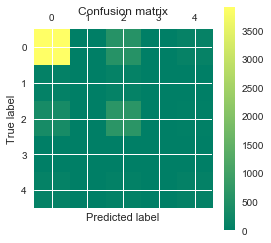

In [51]:
plt.matshow(cm)
plt.title('Confusion matrix')
c = plt.summer()
plt.colorbar(c)
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

In [52]:
from sklearn.metrics import classification_report

In [53]:
target_names = ['PEOPLE', 'ENVIRONMENT', 'EQUIPMENT', 'ORGANISATION', 'UNSPECIFIED']

In [54]:
print(classification_report(y_test, y_pred, target_names=target_names))
        

              precision    recall  f1-score   support

      PEOPLE       0.89      0.85      0.87      4610
 ENVIRONMENT       0.46      0.07      0.12       162
   EQUIPMENT       0.47      0.63      0.54      1058
ORGANISATION       0.00      0.00      0.00        11
 UNSPECIFIED       0.33      0.31      0.32       209

 avg / total       0.78      0.77      0.77      6050



In [30]:
from sklearn.svm import SVC
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import permutation_test_score

In [31]:
n_classes = np.unique(y).size
n_classes

6

In [32]:

svm = SVC(kernel='linear')
cv = StratifiedKFold(2)

In [ ]:
score, permutation_scores, pvalue = permutation_test_score(
    svm, X, y, scoring="accuracy", cv=cv, n_permutations=100, n_jobs=1)

In [48]:
print("Classification score %s (pvalue : %s)" % (score, pvalue))

NameError: name 'score' is not defined

In [ ]:
plt.hist(permutation_scores, 20, label='Permutation scores')

In [ ]:
ylim = plt.ylim()

In [ ]:
plt.plot(2 * [score], ylim, '--g', linewidth=3,
         label='Classification Score'
         ' (pvalue %s)' % pvalue)

In [ ]:
plt.plot(2 * [1. / n_classes], ylim, '--k', linewidth=3, label='Luck')


In [ ]:
plt.ylim(ylim)
plt.legend()
plt.xlabel('Score')
plt.show()

In [45]:
from sklearn.metrics import coverage_error

In [73]:
y_true = np.array(y_test)

In [74]:
y_score = np.array(y_pred)

In [75]:
coverage_error(y_test, y_score)

ValueError: multiclass format is not supported

In [31]:
cause_dict

{'     nb      vcnb  ': 5,
 'ENVIRONMENT / WEATHER': 1,
 'EQUIPMENT': 2,
 'ORGANIZATION': 4,
 'PEOPLE': 0,
 'UNSPECIFIED': 3}

In [32]:
text = ["A CREW MEMBER WAS OBSERVED WALKING DOWN THE STEPS IN ROUGH WEATHER WITH BOTH HIS HANDS OCCUPIED."]
vec_text = vectorizer.transform(text).toarray()

In [33]:
clf.predict(vec_text)

array([0], dtype=int64)

In [34]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, )

In [35]:
pd.DataFrame(vec_text, columns=vectorizer.get_feature_names())

,00,000,0000,0000h,0000hrs,0005,0006,0008,000lb,001,...,œsvejserojneâ,œtaking,œthe,œthink,œtool,œweak,œwere,œwhatever,œworking,œworst
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [34]:
shuffle_validator = cross_validation.ShuffleSplit(len(X), n_iter=20, test_size=0.2)
def test_classifier(clf):
    scores = cross_validation.cross_val_score(clf, X, y, cv=shuffle_validator)
    print("Accuracy: %0.4f (+/- %0.2f)" % (scores.mean(), scores.std()))

In [ ]:
test_classifier(clf)

Accuracy: 0.7720 (+/- 0.00)


In [36]:
taws_df.ix[163]

CAUSE_LEVEL_1                                                           PEOPLE
Description                  While rigging anti piracy equipments it was no...
Resolution                   Crew member was warned about the unsafe practi...
Corrective_Action_lessons                                                  NaN
General_Catigory                                                      NEAR CUT
LOCATION                                                                  DECK
Merge                        While rigging anti piracy equipments it was no...
Name: 163, dtype: object

In [37]:
zaws_df = pd.read_excel('500sheet.xlsx', 'Sheet1', index_col=None)

In [39]:
zaws_df.head()

,records
0,"J/Eng was checking the chemical racks, where h..."
1,I found out that Pilot combination ladder (P) ...
2,AT (Time). One crew member kept food in microw...
3,During loading operations in (Location) by shi...
4,BEFORE WHEN WE WERE ENTERING INTO CARGO HOLD N...


In [40]:
t = zaws_df.ix[range(499)]

In [41]:
print(t)

                                               records
0    J/Eng was checking the chemical racks, where h...
1    I found out that Pilot combination ladder (P) ...
2    AT (Time). One crew member kept food in microw...
3    During loading operations in (Location) by shi...
4    BEFORE WHEN WE WERE ENTERING INTO CARGO HOLD N...
5    Loading Master Found Using Cell Phone On deck,...
6    Deck Crew not wearing Safety Helmet while work...
7    During bunkering operation found 4/E not wear ...
8    One of the crew members lost his eye goggles i...
9    GENERATOR SPARE CYLINDER HEAD WAS FOUND UNSECU...
10   The Fitter was noticed by the master coming on...
11   It was found that there was a fire in the dust...
12   As i enter the crew mess to get some water to ...
13   A CREW MEMBER WAS OBSERVED WALKING DOWN THE ST...
14   DURING ROUTINE CHECKING AROUND DECK FOUND AB  ...
15   The tug broke the ships rope while pulling it....
16   Ch Off found moving on deck without Safety hel...
17   Greas

In [42]:
t

,records
0,"J/Eng was checking the chemical racks, where h..."
1,I found out that Pilot combination ladder (P) ...
2,AT (Time). One crew member kept food in microw...
3,During loading operations in (Location) by shi...
4,BEFORE WHEN WE WERE ENTERING INTO CARGO HOLD N...
5,"Loading Master Found Using Cell Phone On deck,..."
6,Deck Crew not wearing Safety Helmet while work...
7,During bunkering operation found 4/E not wear ...
8,One of the crew members lost his eye goggles i...
9,GENERATOR SPARE CYLINDER HEAD WAS FOUND UNSECU...


In [43]:
c = zaws_df.ix[123]
vect_c = vectorizer.transform(c).toarray()

In [44]:
clf.predict(vect_c)

array([2], dtype=int64)

In [45]:
j = 0


In [46]:
u = 0

In [47]:
for j in range(499):
    z = zaws_df.ix[j]
    vect_z = vectorizer.transform(z).toarray()
    p = clf.predict(vect_z)
    print(p)         

[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[2]
[2]
[2]
[0]
[2]
[2]
[2]
[2]
[2]
[2]
[0]
[2]
[2]
[2]
[2]
[2]
[2]
[2]
[2]
[2]
[2]
[2]
[0]
[2]
[2]
[2]
[0]
[2]
[0]
[2]
[0]
[2]
[2]
[0]
[0]
[2]
[2]
[2]
[2]
[0]
[0]
[2]
[2]
[0]
[0]
[2]
[0]
[2]
[0]
[0]
[2]
[2]
[0]
[2]
[2]
[2]
[2]
[0]
[0]
[0]
[2]
[0]
[0]
[2]
[2]
[2]
[2]
[0]
[2]
[2]
[0]
[2]
[2]
[2]
[0]
[0]
[0]
[2]
[2]
[2]
[2]
[2]
[0]
[2]
[2]
[0]
[2]
[2]
[2]
[2]
[2]
[2]
[2]
[2]
[2]
[0]
[2]
[2]
[0]
[1]
[0]
[1]
[1]
[1]
[1]
[0]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[1]
[0]
[1]
[2]
[2]
[2]
[1]
[0]
[0]
[2]
[2]
[1]
[2]
[0]
[1]
[2]
[0]
[2]
[0]
[0]
[0]
[0]
[0]
[1]
[2]
[1]
[1]
[0]
[1]
[1]
[0]
[0]
[2]
[2]
[2]
[2]


In [48]:
zaws_df.describe()

,records
count,499
unique,477
top,During the fire drill engine fitter slipped an...
freq,4


In [49]:
from numpy.random import randn

In [50]:
from matplotlib.axes import Subplot as plt

In [51]:
from scipy.signal import freqz



In [52]:
import matplotlib
from matplotlib.backends.backend_qt4agg import FigureCanvasQTAgg as FigureCanvas
from matplotlib.figure import Figure
from matplotlib.axes import Subplot


In [53]:
taws_df.describe()

,CAUSE_LEVEL_1,Description,Resolution,Corrective_Action_lessons,General_Catigory,LOCATION,Merge
count,30248,30248,23133,27446,30248,30248,30248
unique,6,29516,21237,23691,568,27,29861
top,PEOPLE,Grinding machine left in running condition wit...,Training,1. Noted.,PPE NOT USED,DECK,During routine housekeeping and safety inspect...
freq,23193,5,297,89,2342,11604,4


In [54]:
taws_df['CAUSE_LEVEL_1'].describe()

count      30248
unique         6
top       PEOPLE
freq       23193
Name: CAUSE_LEVEL_1, dtype: object

In [55]:
zaws_df['records'].describe()

count                                                   499
unique                                                  477
top       During the fire drill engine fitter slipped an...
freq                                                      4
Name: records, dtype: object

In [61]:
tf_clf_dnn = skflow.TensorFlowDNNClassifiere(hiddden_units=[20,40,20],
                                             n_classes=2, batch_size=256,
                                             steps=1000, learning_rate=0.05)

NameError: name 'skflow' is not defined

In [62]:
from tensorflow.contrib.skflow.python import skflow

ImportError: No module named 'tensorflow'

In [63]:
import tensorflow.contrib.skflow

ImportError: No module named 'tensorflow'

In [68]:
import tensorflow as tf


ImportError: No module named 'tensorflow'

In [69]:
taws_df['CAUSE_LEVEL_1'].unique()

array(['PEOPLE', 'ENVIRONMENT / WEATHER', 'EQUIPMENT', 'UNSPECIFIED',
       'ORGANIZATION', '     nb      vcnb  '], dtype=object)

In [70]:
causes

array(['PEOPLE', 'ENVIRONMENT / WEATHER', 'EQUIPMENT', 'UNSPECIFIED',
       'ORGANIZATION', '     nb      vcnb  '], dtype=object)

In [56]:
y = taws_df["CAUSE_LEVEL_1"].map(cause_dict)

In [59]:
import csv

In [58]:
X

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ..., 
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [60]:
jaws_df = pd.read_excel('jmarge.xlsx', 'Sheet1', index_col=None)

In [61]:
jaws_df.head()

,Description
0,"J/Eng was checking the chemical racks, where h..."
1,One stay wire connected to Christmas Tree loos...
2,I found out that Pilot combination ladder (P) ...
3,AT (Time). One crew member kept food in microw...
4,During loading operations in (Location) by shi...


In [62]:
s = 0 

In [63]:
for s in range(30248):
    v = jaws_df.ix[s]
    vect_v = vectorizer.transform(v).toarray()
    w = clf.predict(vect_v)
    print(w)
   

[0]
[1]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[2]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[2]
[0]
[0]
[2]
[0]
[1]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[0]
[1]
[2]
[0]
[1]
[0]
[2]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[2]
[0]
[0]
[0]
[2]
[4]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[0]
[1]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[2]
[0]
[2]
[2]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[2]
[4]
[0]
[0]
[2]
[2]
[2]
[0]
[0]
[0]
[2]
[0]
[0]
[0]
[2]
[0]
[0]
[0]
[2]
[0]
[2]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[2]
[0]
[0]
[0]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[4]
[0]
[2]
[0]
[0]
[0]
[2]
[2]
[0]
[0]


In [64]:
w

array([2], dtype=int64)

In [65]:
d = 0 

In [66]:
eaws_df = pd.read_excel('jequip.xlsx', 'Sheet1', index_col=None)

In [68]:
o = jaws_df

In [69]:
for s in range(5054):
    n = jaws_df.ix[s]
    vect_n = vectorizer.transform(n).toarray()
    e = clf.predict(vect_n)
    probas = e.predict_proba(vect_n)
    print(e)

AttributeError: 'numpy.ndarray' object has no attribute 'predict_proba'

In [85]:
for s in range(5054):
    n = jaws_df.ix[s]
    vect_n = vectorizer.transform(n).toarray()
    e = clf.predict(vect_n)
    q = clf.score(vect_n)
    print(e)

TypeError: score() missing 1 required positional argument: 'y'

In [77]:
taws_df.to_excel('ofcause.xlsx', sheet_name='Sheet1')

In [78]:
k = taws_df['CAUSE_LEVEL_1']

In [84]:
jaws_df.to_excel('ofcause.xlsx', sheet_name='Sheet1')

In [79]:
import xlrd

In [80]:
g = y.to_frame

In [87]:
with open("C:\\Users\\datta\\agent.log", 'a') as f:
    print(y, file=f)

In [81]:
taws_df[19:25]

,CAUSE_LEVEL_1,Description,Resolution,Corrective_Action_lessons,General_Catigory,LOCATION,Merge
19,PEOPLE,Ch Off found moving on deck without Safety hel...,Ch Off was instructed to use required PPE at a...,Near miss viewed seriously as Ch. Off. is a se...,PPE NOT USED,DECK,Ch Off found moving on deck without Safety hel...
20,PEOPLE,Grease was found on the stbd side gangway step...,1.Access areas should always be kept free from...,RCA - Poor housekeeping as grease on gangway s...,NEAR SLIP/TRIP,GANGWAY,Grease was found on the stbd side gangway step...
21,PEOPLE,During routine housekeeping and safety inspect...,"Fire doors to be kept closed at all times, and...",RCA-Inadequate securing and inadequate supervi...,FIRE PROTECTION - DOOR,ENGINE ROOM,During routine housekeeping and safety inspect...
22,PEOPLE,MTM & Wiper found not wearing safety helmet wh...,Both engine ratings were instructed to use req...,Safety helmet should be used when working in e...,PPE NOT USED,INTERIOR SPACE,MTM & Wiper found not wearing safety helmet wh...
23,PEOPLE,During routine inspection it was noted loose i...,Vessel to be secured for sea at all times. In ...,RCA - Inadequate securing All loose equipment ...,NEAR FALLING OBJECT,OTHER,During routine inspection it was noted loose i...
24,PEOPLE,A CREW MEMBER WAS OBSERVED WALKING DOWN THE ST...,NOTIFIED ABOUT THE TRIPPING HAZARD AND CREW WA...,"RCA ? Inadequate behavior, Lack of knowledge C...",FALL OR NEAR FALL,OTHER,A CREW MEMBER WAS OBSERVED WALKING DOWN THE ST...


In [88]:
p = taws_df[19:24]

In [89]:
p

,CAUSE_LEVEL_1,Description,Resolution,Corrective_Action_lessons,General_Catigory,LOCATION,Merge
19,PEOPLE,Ch Off found moving on deck without Safety hel...,Ch Off was instructed to use required PPE at a...,Near miss viewed seriously as Ch. Off. is a se...,PPE NOT USED,DECK,Ch Off found moving on deck without Safety hel...
20,PEOPLE,Grease was found on the stbd side gangway step...,1.Access areas should always be kept free from...,RCA - Poor housekeeping as grease on gangway s...,NEAR SLIP/TRIP,GANGWAY,Grease was found on the stbd side gangway step...
21,PEOPLE,During routine housekeeping and safety inspect...,"Fire doors to be kept closed at all times, and...",RCA-Inadequate securing and inadequate supervi...,FIRE PROTECTION - DOOR,ENGINE ROOM,During routine housekeeping and safety inspect...
22,PEOPLE,MTM & Wiper found not wearing safety helmet wh...,Both engine ratings were instructed to use req...,Safety helmet should be used when working in e...,PPE NOT USED,INTERIOR SPACE,MTM & Wiper found not wearing safety helmet wh...
23,PEOPLE,During routine inspection it was noted loose i...,Vessel to be secured for sea at all times. In ...,RCA - Inadequate securing All loose equipment ...,NEAR FALLING OBJECT,OTHER,During routine inspection it was noted loose i...


In [90]:
vect_s = vectorizer.transform(p).toarray()

In [91]:
clf.predict(vect_s)

array([0, 0, 0, 0, 0, 0, 0], dtype=int64)

In [92]:
vect_s

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ..., 
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [86]:
text_file = open("write_it.text","w") 

In [87]:
text_file.write(g)

TypeError: write() argument must be str, not method

In [87]:
text_file = open("mytest.text","w") 
for i in range(1,10):
    text_file.write(str(jaws_df.ix[i]))
text_file.close()

In [88]:
text_file = open("mytest.text","w") 
for i in range(len(y)):
    text_file.write(str(y))
text_file.close()

In [89]:
print(len(y))


30248


In [70]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [95]:
myprob = clf.predict_proba(X)

In [97]:
np.set_printoptions(precision= 5, threshold=np.inf)

In [98]:
myprob

array([[  1.00000e+000,   2.58174e-023,   2.21785e-013,   6.67344e-096,
          1.39679e-019,   1.21118e-180],
       [  9.47398e-007,   2.60859e-007,   9.99999e-001,   1.93902e-054,
          1.33540e-016,   5.15416e-108],
       [  9.97290e-001,   1.20090e-009,   2.71002e-003,   6.94920e-044,
          4.25352e-011,   1.35657e-080],
       [  1.00000e+000,   9.17865e-016,   8.45891e-009,   8.97636e-066,
          1.06452e-014,   2.87599e-119],
       [  1.00000e+000,   2.72533e-028,   3.88143e-017,   5.51503e-109,
          1.71351e-024,   2.78495e-198],
       [  9.99168e-001,   1.77740e-012,   8.32208e-004,   3.69439e-062,
          7.12896e-012,   5.26107e-111],
       [  1.00000e+000,   1.93144e-017,   1.19756e-015,   6.25476e-049,
          1.80996e-016,   3.40548e-087],
       [  1.00000e+000,   1.74246e-046,   1.32318e-035,   3.95066e-126,
          2.85698e-039,   4.34177e-209],
       [  1.00000e+000,   4.20303e-043,   3.90512e-033,   4.17080e-114,
          7.09343e-036, 

In [99]:
clf.predict_log_proba(X)

array([[ -2.27374e-13,  -5.20110e+01,  -2.91371e+01,  -2.19150e+02,
         -4.34149e+01,  -4.14274e+02],
       [ -1.38695e+01,  -1.51593e+01,  -1.20826e-06,  -1.23677e+02,
         -3.65521e+01,  -2.47039e+02],
       [ -2.71370e-03,  -2.05402e+01,  -5.91080e+00,  -9.93751e+01,
         -2.38807e+01,  -1.83902e+02],
       [ -8.45887e-09,  -3.46245e+01,  -1.85880e+01,  -1.49776e+02,
         -3.21737e+01,  -2.72951e+02],
       [  0.00000e+00,  -6.34698e+01,  -3.77877e+01,  -2.49274e+02,
         -5.47235e+01,  -4.54888e+02],
       [ -8.32554e-04,  -2.70559e+01,  -7.09143e+00,  -1.41453e+02,
         -2.56669e+01,  -2.53927e+02],
       [  0.00000e+00,  -3.84857e+01,  -3.43585e+01,  -1.10993e+02,
         -3.62481e+01,  -1.99100e+02],
       [  0.00000e+00,  -1.05364e+02,  -8.03104e+01,  -2.88752e+02,
         -8.87511e+01,  -4.79772e+02],
       [  0.00000e+00,  -9.75754e+01,  -7.46230e+01,  -2.61067e+02,
         -8.09339e+01,  -4.21605e+02],
       [  0.00000e+00,  -8.92837e+01,

In [100]:
clf.predict(X_test)

array([0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0,
       0, 2, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 4, 0, 0, 0, 0,
       0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0,
       0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2,
       0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 0,
       0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 4, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 4, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 2, 0,
       0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 0, 2, 0, 2,
       0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 0, 4, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0,
       0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 2, 0, 0, 2, 4, 0,
       2, 0, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0,
       0, 0,

In [101]:
clf.coef_

array([[-10.73013, -12.55468, -13.47097, -14.16412, -13.06551, -14.16412,
        -13.47097, -13.47097, -14.16412, -14.16412, -13.06551, -14.16412,
        -14.16412, -13.47097, -13.06551, -13.47097, -14.16412, -14.16412,
        -13.47097, -13.47097, -13.47097, -13.47097, -13.06551, -14.16412,
        -13.47097, -13.47097, -12.77783, -13.47097, -14.16412, -12.55468,
        -13.47097, -14.16412, -13.47097, -14.16412, -13.47097, -14.16412,
        -10.90602, -13.47097, -13.47097, -14.16412, -14.16412, -13.47097,
        -14.16412, -13.06551, -13.47097, -13.47097, -14.16412, -13.47097,
        -14.16412, -14.16412, -14.16412, -14.16412, -13.47097, -13.47097,
        -14.16412, -13.47097, -13.47097, -14.16412, -14.16412, -13.47097,
        -14.16412, -14.16412, -13.47097, -13.47097, -13.47097, -13.06551,
        -10.73013, -12.77783, -14.16412, -13.47097, -14.16412, -13.47097,
        -14.16412, -14.16412, -14.16412, -14.16412, -14.16412, -14.16412,
        -13.47097, -13.06551, -14.1641

In [98]:
def train_test(n):
    t = X * n
    k = y * n
    model.fit(t, k)
    print

In [79]:
my_data = [taws_df['Description'], y, taws_df['CAUSE_LEVEL_1'], y_test]
result = pd.concat(my_data,axis=1)
print(result[0:3])

                                         Description  CAUSE_LEVEL_1  \
0  J/Eng was checking the chemical racks, where h...              0   
1  One stay wire connected to Christmas Tree loos...              1   
2  I found out that Pilot combination ladder (P) ...              0   

           CAUSE_LEVEL_1  CAUSE_LEVEL_1  
0                 PEOPLE            NaN  
1  ENVIRONMENT / WEATHER            NaN  
2                 PEOPLE            0.0  


In [80]:
print(result)

                                             Description  CAUSE_LEVEL_1  \
0      J/Eng was checking the chemical racks, where h...              0   
1      One stay wire connected to Christmas Tree loos...              1   
2      I found out that Pilot combination ladder (P) ...              0   
3      AT (Time). One crew member kept food in microw...              0   
4      During loading operations in (Location) by shi...              0   
5      BEFORE WHEN WE WERE ENTERING INTO CARGO HOLD N...              0   
6      Loading Master Found Using Cell Phone On deck,...              0   
7      Deck Crew not wearing Safety Helmet while work...              0   
8      During bunkering operation found 4/E not wear ...              0   
9      One of the crew members lost his eye goggles i...              0   
10     GENERATOR SPARE CYLINDER HEAD WAS FOUND UNSECU...              0   
11     The Fitter was noticed by the master coming on...              0   
12     It was found that 

In [94]:
result.to_excel('my_datare.xlsx')

In [104]:
print(clf.predict(X[2:3]))

[0]


In [55]:
pwas_df = pd.read_excel('200ex.xlsx', 'Sheet1', index_col=None)

In [56]:
pwas_df.head()

,Description
0,"J/Eng was checking the chemical racks, where h..."
1,One stay wire connected to Christmas Tree loos...
2,I found out that Pilot combination ladder (P) ...
3,AT (Time). One crew member kept food in microw...
4,During loading operations in (Location) by shi...


In [57]:
n = 0

In [62]:
for n in range(200):
    pm = pwas_df.ix[n]
    vect_pm = vectorizer.transform(pm).toarray()
    m = clf.predict(vect_pm)
    print(m)  

[0]
[1]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[2]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[2]
[0]
[0]
[2]
[0]
[1]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[0]
[1]
[2]
[0]
[1]
[0]
[2]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[2]
[0]
[0]
[0]
[2]
[4]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[0]
[1]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[2]
[0]
[2]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[4]
[0]
[0]
[2]
[2]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]


In [ ]:
def sample():
   x = []
for n in range(200):
    if n not in x:
    x.append(a)

In [60]:
m_test = m
m_test

array([0], dtype=int64)

In [81]:
pwas_df.describe()

,Description
count,200
unique,184
top,01. Portable Pump not ready on bunkering site ...
freq,4


In [12]:
sample_dataframe = taws_df.sample(n=200)

In [13]:
sample_dataframe


,CAUSE_LEVEL_1,Description,Resolution,Corrective_Action_lessons,General_Catigory,LOCATION,Merge
2079,PEOPLE,"0625 - POB, 0630-Master Pilot exchange carried...",Vigilant Bridge Team and always monitor Pilot'...,RCA - Inappropriate behavior and Incorrect nav...,NAVIGATION AND VESSEL MOVEMENT,WHEEL HOUSE AND BRIDGE DECKS,"0625 - POB, 0630-Master Pilot exchange carried..."
14648,PEOPLE,Subject found using safety helmet without chin...,Subject was briefed and told to use chin strap...,Matter was discussed during tool box meeting.,ppe missing,DECK,Subject found using safety helmet without chin...
13810,PEOPLE,casecade tank High level alarm actived,to monitor the level when topping up the level...,41799,equipment condition,ENGINE ROOM,casecade tank High level alarm actived to moni...
19697,PEOPLE,SEAWAY WIRE BEING HEAVED / TAKEN ON DRUM IN UN...,DUTY OFFICER BRIEFED ABOUT SUCH UNSAFE SITUATI...,NaN,EQUIPMENT DAMAGE,DECK,SEAWAY WIRE BEING HEAVED / TAKEN ON DRUM IN UN...
18050,EQUIPMENT,Crew noticed pulled yarns in hawser and invest...,The crew repaired the carriage bolt by hammeri...,Grommet bolts should be inspected daily and ma...,Equipment damage,DECK,Crew noticed pulled yarns in hawser and invest...
442,PEOPLE,While Applying Oxalic on liferaft emergency li...,Master once again call the attention of the cr...,concur wioth corrective action suggested by Ma...,FALL OR NEAR FALL,LIFEBOAT,While Applying Oxalic on liferaft emergency li...
8541,PEOPLE,The safety flaps of the hook is not in order (...,NaN,We’ll rectify the flap.,crane maintenance,OTHER,The safety flaps of the hook is not in order (...
25948,PEOPLE,While changing the name of the ship on the lif...,The immediate cause was complacency at the t...,The hazards of complacency at doing work was ...,Personal protection not used,DECK,While changing the name of the ship on the lif...
25579,PEOPLE,Two crewmembers handling long ladder up engine...,Crewmember immediately reminded of standing sa...,All department heads told to remind crew of go...,NEAR FALL TO LOWER LEVEL,ENGINE ROOM,Two crewmembers handling long ladder up engine...
13243,PEOPLE,Once crew painting overhead without safety goo...,NaN,Stop card was shown and the concerned crew was...,PPE NOT USED,DECK,Once crew painting overhead without safety goo...


In [69]:
cons_df = pd.read_excel('200sheetana.xlsx', 'Sheet1', index_col=None)

In [70]:
cons_df.head()

,Description,HUMAN CLASSIFIED,humnan,machine
0,"J/Eng was checking the chemical racks, where h...",PEOPLE,0,0
1,One stay wire connected to Christmas Tree loos...,ENVIRONMENT / WEATHER,1,1
2,I found out that Pilot combination ladder (P) ...,PEOPLE,0,0
3,AT (Time). One crew member kept food in microw...,PEOPLE,0,0
4,During loading operations in (Location) by shi...,PEOPLE,0,0


In [72]:
m_test = cons_df['humnan']

In [73]:
m_pred = cons_df['machine']

In [74]:
cm2 = confusion_matrix(m_test, m_pred)

In [75]:
cm2

array([[152,   0,  10,   0,   0],
       [  4,   3,   0,   0,   0],
       [  4,   0,  18,   0,   0],
       [  0,   0,   1,   0,   0],
       [  4,   0,   2,   0,   2]])

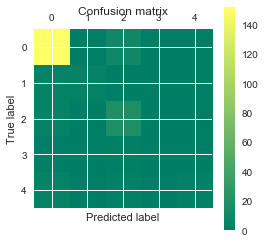

In [76]:
plt.matshow(cm2)
plt.title('Confusion matrix')
c = plt.summer()
plt.colorbar(c)
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

In [77]:
print(classification_report(m_test, m_pred, target_names=target_names))

              precision    recall  f1-score   support

      PEOPLE       0.93      0.94      0.93       162
 ENVIRONMENT       1.00      0.43      0.60         7
   EQUIPMENT       0.58      0.82      0.68        22
ORGANISATION       0.00      0.00      0.00         1
 UNSPECIFIED       1.00      0.25      0.40         8

 avg / total       0.89      0.88      0.87       200

